<a class="anchor" id="0."></a>**Content**

1. [Summary](#1.)
1. [Detecting Faces in National Football Team Image](#1e1.)
1. [FetchLFW class](#2.)
1. [Fetching LFW images](#3.)
1. [Helper Funciton:get_photo_gallery()](#4.)
1. [Showing Images as Photo Gallery](#5.)
1. [Detecting Faces in LFW Dataset](#7.)
1. [Showing Detected Faces as Photo Gallery](#8.)

Quick Links: [1](#1.)  |  [2](#1e1.)  |  [3](#2.)  |  [4](#3.)  |  [5](#4.)  |   [6](#5.)  |  [7](#7.)  |  [8](#8.)

In [21]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

#Visiulazation
import matplotlib.pyplot as plt

#image processing
import cv2

#extracting zippped file
import tarfile

#systems
import os
print(os.listdir("D:\9C\Face detection"))
# print(os.listdir("../input/lfwpeople"))

['face-detection-with-opencv.ipynb', 'group3.jpg', 'haarcascade_frontalface_default.xml']


In [22]:
class FaceDetector():

    def __init__(self,faceCascadePath):
        self.faceCascade=cv2.CascadeClassifier(faceCascadePath)


    def detect(self, image, scaleFactor=1.1,
               minNeighbors=5,
               minSize=(30,30)):
        
        #function return rectangle coordinates of faces for given image
        rects=self.faceCascade.detectMultiScale(image,
                                                scaleFactor=scaleFactor,
                                                minNeighbors=minNeighbors,
                                                minSize=minSize)
        return rects

In [23]:
#Frontal face of haar cascade loaded
frontal_cascade_path="haarcascade_frontalface_default.xml"

#Detector object created
fd=FaceDetector(frontal_cascade_path)

In [24]:
#An image contains faces, loaded
national_team_org=cv2.imread("D:\9C\Face detection\group3.jpg")

In [25]:
def get_national_team():
    return np.copy(national_team_org)

def show_image(image):
    plt.figure(figsize=(18,15))
    #Before showing image, bgr color order transformed to rgb order
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([])
    plt.yticks([])
    plt.show()

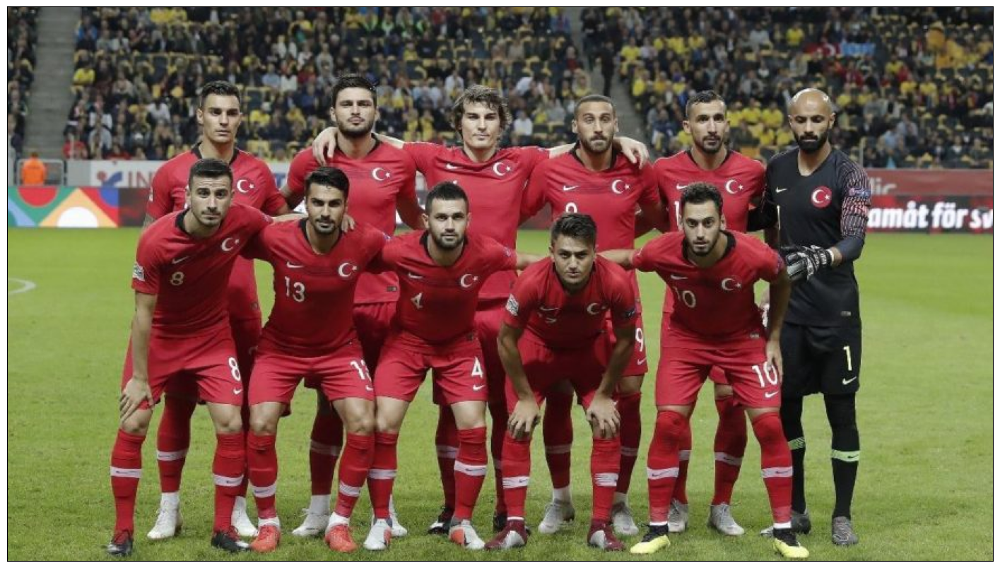

In [26]:
show_image(get_national_team())

In [27]:
def detect_face(image, scaleFactor, minNeighbors, minSize):
    # face will detected in gray image
    image_gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    faces=fd.detect(image_gray,
                   scaleFactor=scaleFactor,
                   minNeighbors=minNeighbors,
                   minSize=minSize)

    for x, y, w, h in faces:
        #detected faces shown in color image
        cv2.rectangle(image,(x,y),(x+w, y+h),(127, 255,0),3)

    show_image(image)
    

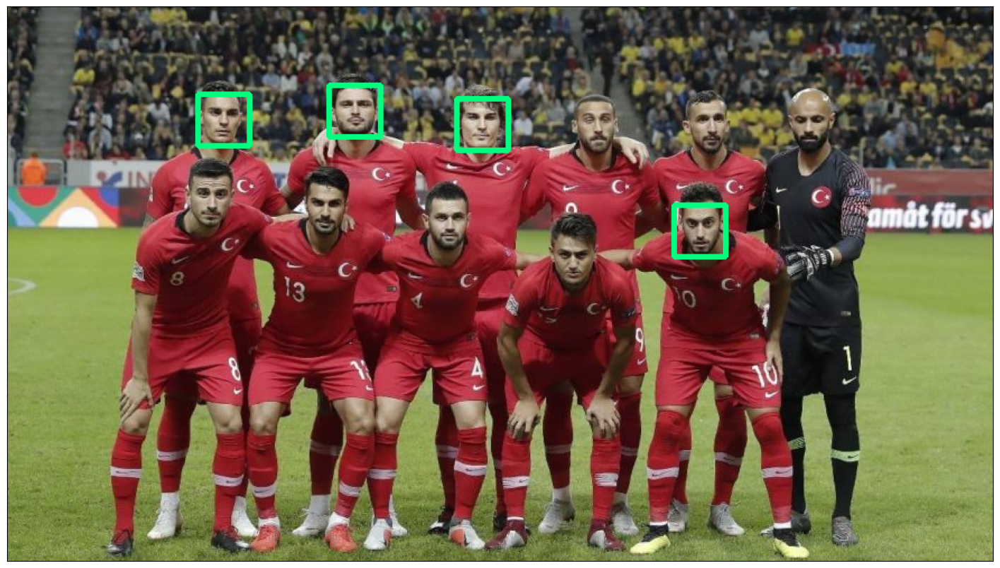

In [28]:
national_team=get_national_team()

detect_face(image=national_team, 
            scaleFactor=1.9, 
            minNeighbors=3, 
            minSize=(30,30))

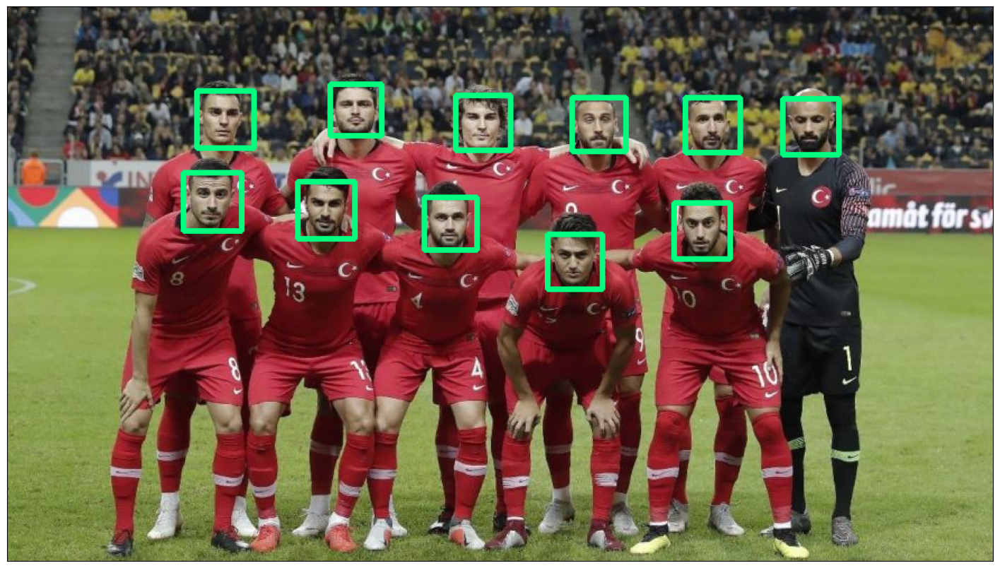

In [29]:
national_team=get_national_team()
#Let's play around function parameters
detect_face(image=national_team, 
            scaleFactor=1.3, 
            minNeighbors=3, 
            minSize=(30,30))

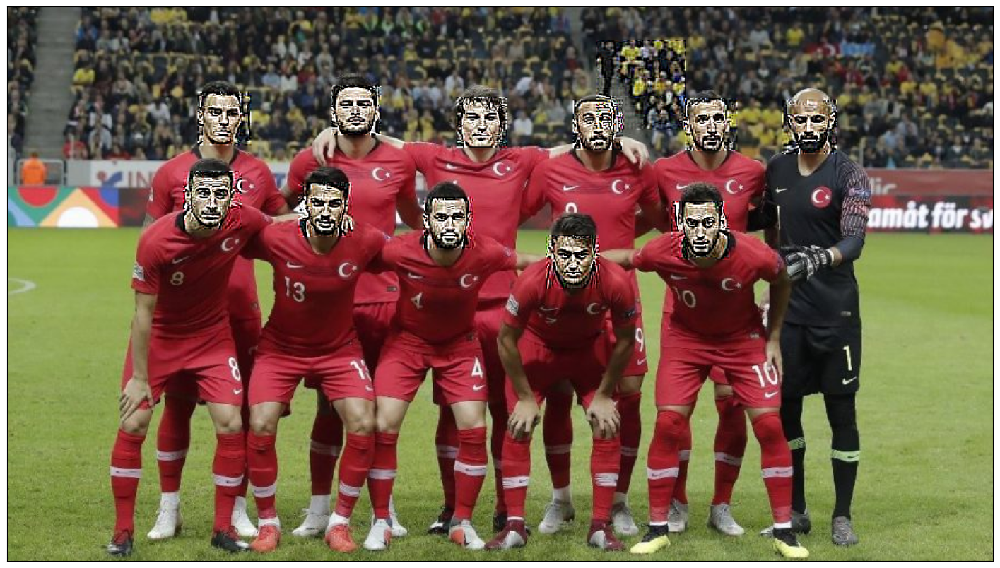

In [30]:
import cv2
import numpy as np

# Define the apply_face_sharpening function to apply sharpening filter to the detected faces
def apply_face_sharpening(image, faces):
    # Loop through each detected face
    for (x, y, w, h) in faces:
        # Extract the region of interest (face)
        face_roi = image[y:y+h, x:x+w]
        # Apply sharpening filter to the face region
        kernel = np.array([[-1, -1, -1],
                           [-1, 9, -1],
                           [-1, -1, -1]])
        sharpened_face = cv2.filter2D(face_roi, -1, kernel)
        # Replace the sharpened face region in the original image
        image[y:y+h, x:x+w] = sharpened_face
    return image

# Load the national team image
national_team_org = cv2.imread("D:\9C\Face detection\group3.jpg")

# Load the pre-trained face detection model (Haar Cascade Classifier)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Convert the image to grayscale for face detection
gray_image = cv2.cvtColor(national_team_org, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
# Apply sharpening filter to the detected faces
sharpened_image = apply_face_sharpening(national_team_org.copy(), faces)
# Show the sharpened image with detected faces
show_image(sharpened_image)

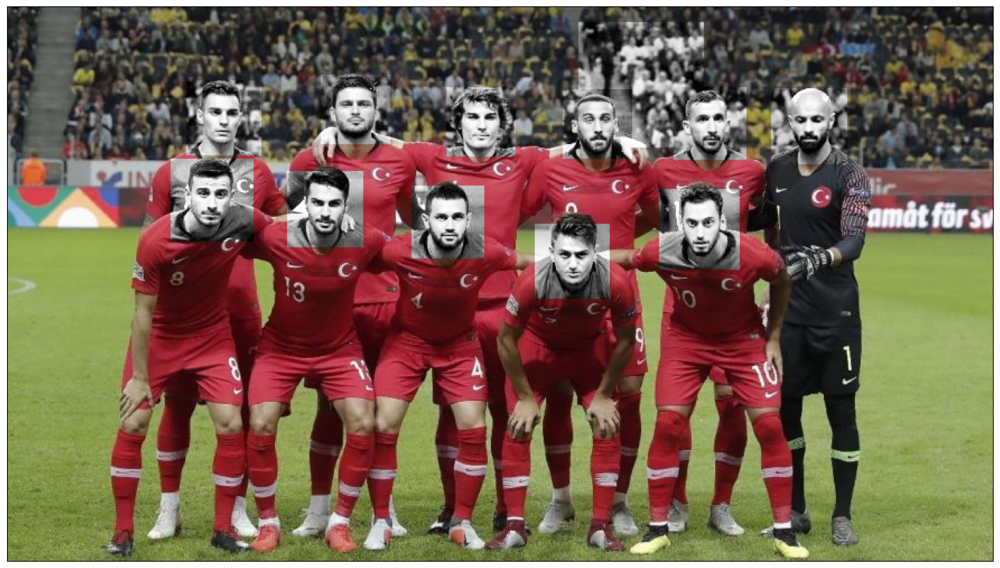

In [38]:
import cv2
import matplotlib.pyplot as plt

def apply_face_enhancement(image, faces):
    # Create a copy of the original image
    enhanced_image = image.copy()
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Loop through each detected face
    for (x, y, w, h) in faces:
        # Calculate the enhanced dimensions of the face ROI
        x_enhanced = int(x - 0.2 * w)
        y_enhanced = int(y - 0.2 * h)
        w_enhanced = int(1.4 * w)
        h_enhanced = int(1.4 * h)
        
        # Extract the enhanced region of interest (face)
        face_roi = gray[y_enhanced:y_enhanced+h_enhanced, x_enhanced:x_enhanced+w_enhanced]
        
        # Apply histogram equalization to enhance the contrast of the face
        face_roi = cv2.equalizeHist(face_roi)
        
        # Replace the enhanced face region in the original image
        enhanced_image[y_enhanced:y_enhanced+h_enhanced, x_enhanced:x_enhanced+w_enhanced] = cv2.cvtColor(face_roi, cv2.COLOR_GRAY2BGR)
    
    return enhanced_image

# Load the national team image
image_path = "D:/9C/Face detection/group3.jpg"
national_team_org = cv2.imread(image_path)

faces =  fd.detect(national_team_org)
enhanced_image= apply_face_enhancement(national_team_org, faces)
show_image(enhanced_image)

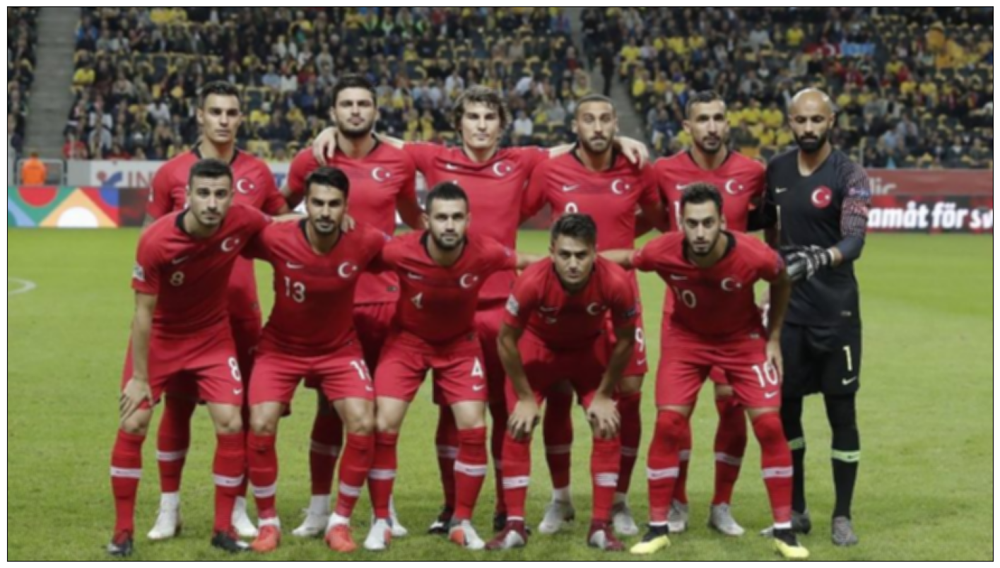

In [41]:
# Define the apply_spatial_filter function to apply a spatial filter
def apply_spatial_filter(image, kernel):
  # Apply filter using convolution
  filtered_image = cv2.filter2D(image, -1, kernel)
  return filtered_image

# Define the 3x3 averaging filter kernel
kernel = np.ones((3, 3), np.float32) / 9.0

# Load the national team image
national_team_org = cv2.imread("D:\9C\Face detection\group3.jpg")

# Apply the spatial filter to the image
filtered_image = apply_spatial_filter(national_team_org, kernel)

# Show the filtered image
show_image(filtered_image)
# averaging filter kernel    spatial filter

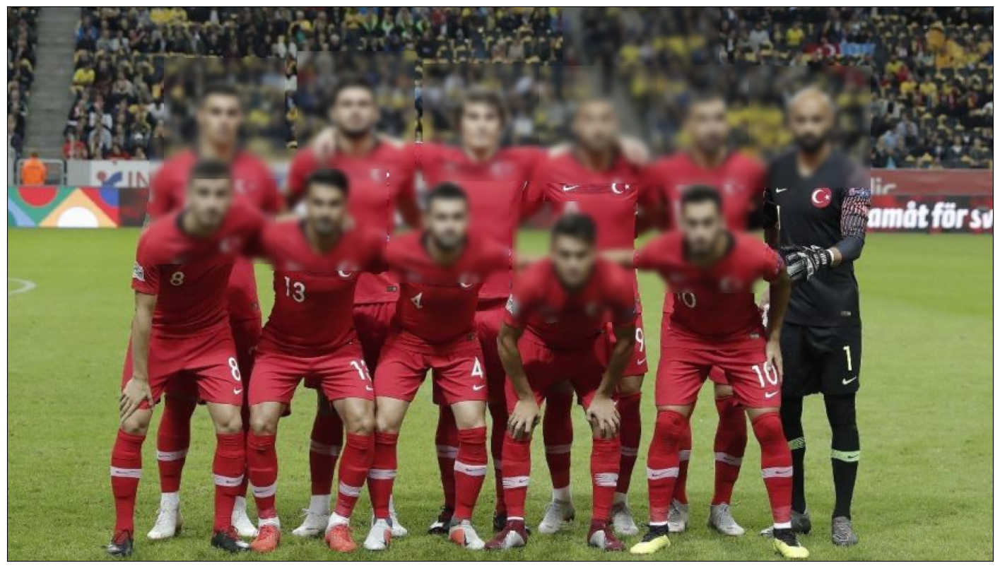

In [46]:
import cv2
import matplotlib.pyplot as plt

def apply_face_smooth_filter(image, faces):
    # Loop through each detected face
    for (x, y, w, h) in faces:
        # Define the region around the detected face
        x1, y1 = max(0, x - 30), max(0, y - 30)
        x2, y2 = min(image.shape[1], x + w + 30), min(image.shape[0], y + h + 30)
        # Extract the region around the detected face
        face_region = image[y1:y2, x1:x2]
        # Apply Gaussian blur to the region around the detected face
        face_smoothed = cv2.GaussianBlur(face_region, (15, 15), 0)  # Adjust kernel size as needed
        # Replace the smoothed region back into the original image
        image[y1:y2, x1:x2] = face_smoothed
    return image

# Load the national team image
image_path = "D:/9C/Face detection/group3.jpg"
national_team_org = cv2.imread(image_path)

# Check if the image was loaded correctly
if national_team_org is None:
    print("Error: Image not loaded. Check the file path.")
else:
    # Load the pre-trained face detection model (Haar Cascade Classifier)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    # Convert the image to grayscale for face detection
    gray_image = cv2.cvtColor(national_team_org, cv2.COLOR_BGR2GRAY)
    
    # Detect faces in the image
    faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
    # Apply the smoothing filter to the detected faces
    smoothed_image = apply_face_smooth_filter(national_team_org, faces)

    # Display the original and smoothed images
show_image(smoothed_image)


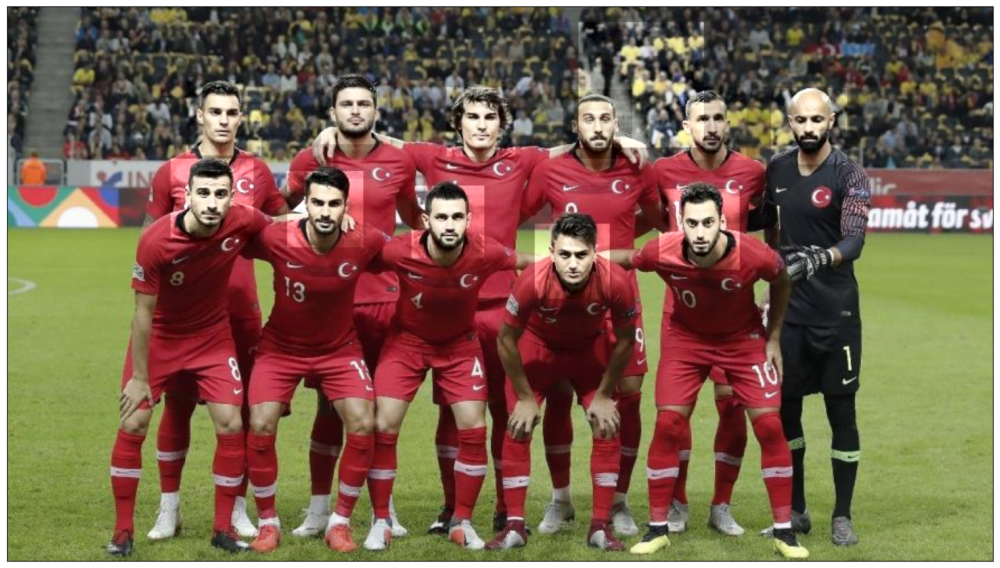

In [51]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the apply_face_color_enhancement function to enhance color in the detected faces
def apply_face_color_enhancement(image, faces):
    # Loop through each detected face
    for (x, y, w, h) in faces:
        # Calculate the enhanced dimensions of the face ROI
        x_enhanced = max(int(x - 0.2 * w), 0)
        y_enhanced = max(int(y - 0.2 * h), 0)
        w_enhanced = min(int(1.4 * w), image.shape[1] - x_enhanced)
        h_enhanced = min(int(1.4 * h), image.shape[0] - y_enhanced)

        # Extract the enhanced region of interest (face)
        face_roi = image[y_enhanced:y_enhanced+h_enhanced, x_enhanced:x_enhanced+w_enhanced]

        # Convert the face region to LAB color space
        face_lab = cv2.cvtColor(face_roi, cv2.COLOR_BGR2LAB)

        # Split the LAB image into L, A, and B channels
        l, a, b = cv2.split(face_lab)

        # Apply histogram equalization to the L channel (lightness)
        l_eq = cv2.equalizeHist(l)

        # Merge the equalized L channel with the original A and B channels
        enhanced_lab = cv2.merge((l_eq, a, b))

        # Convert the enhanced LAB image back to BGR color space
        enhanced_face = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)

        # Replace the enhanced face region in the original image
        image[y_enhanced:y_enhanced+h_enhanced, x_enhanced:x_enhanced+w_enhanced] = enhanced_face
    
    return image

# Load the national team image
image_path = "D:/9C/Face detection/group3.jpg"
national_team_org = cv2.imread(image_path)


# Check if the image was loaded correctly

# Load the pre-trained face detection model (Haar Cascade Classifier)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    
# Convert the image to grayscale for face detection
gray_image = cv2.cvtColor(national_team_org, cv2.COLOR_BGR2GRAY)
    
# Detect faces in the image
faces = face_cascade.detectMultiScale(gray_image, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
# Apply color enhancement to the detected faces
enhanced_image = apply_face_color_enhancement(national_team_org.copy(), faces)
    
# Display the original and enhanced images
show_image(enhanced_image)